In [1]:
import librosa
from librosa import display
from PIL import Image
from matplotlib import pyplot
from numpy import asarray
import matplotlib.pyplot as plt
import numpy as np
import cmath
import seaborn as sns
import scipy
import IPython.display as ipd
import math
from numpy.linalg import inv
import torch 
import torchvision
from torchvision import datasets
import numpy as np
import time
import numpy
import matplotlib.pyplot as plt
import torch.nn as nn
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Uploading clean male voice

In [2]:
train_clean_male, sr1 = librosa.load("train_clean_male.wav",sr=None)
S=librosa.stft(train_clean_male,n_fft=1024,hop_length=512)
ipd.display(ipd.Audio(train_clean_male,rate=16000))

### Uploading Dirty Male Voice

In [3]:
sn,sr2=librosa.load("train_dirty_male.wav",sr=None)
X=librosa.stft(sn,n_fft=1024,hop_length=512)
ipd.display(ipd.Audio(sn,rate=16000))

### Taking Magnitudes of clean voice (S) and dirty voice(X)

In [4]:
mod_S=np.abs(S)
mod_X=np.abs(X)

In [5]:
print(np.shape(mod_S))

(513, 2459)


In [6]:
print(np.shape(mod_X))

(513, 2459)


### Network Creation

As part of the Network we have used the Following Architecture:

1) Convolution Layer with kernel size = 2, stride =1 and 16 filters followed ny ReLu Activation.

 2)Max Pooling with kernel size=2 and stride =1

 3)Convolution Layer with kernel size = 2, stride =1 and 32 filters followed ny ReLu Activation.

 4) Max Pooling with kernel size=2 and stride =2

 5) Reducing the layer to fullyconnected layer with 8160 neurons (layer before the output layer)

 6) The final layer is with 513 neurons with ReLu Activation as we need positive values as part of the output.

In [7]:
class onedcnn(nn.Module):
    def __init__(self):
        super(onedcnn, self).__init__()


        
        self.layer1= nn.Sequential(
            nn.Conv1d(1, 16, kernel_size=2, stride=1),
            nn.ReLU(),
            nn.MaxPool1d(2, stride=1))
        
        self.layer2= nn.Sequential(
            nn.Conv1d(16, 32, kernel_size=2, stride=1),
            nn.ReLU(),
            nn.MaxPool1d(2, stride=2))
        
        self.layer3=torch.nn.Linear(255*16*2, 513)

        self.act=nn.ReLU()
    
    def forward(self, x):

      
        out1 = self.layer1(x)
        out2 = self.layer2(out1)
        out3=out2.reshape(out2.size(0), out2.size(1)*out2.size(2)) 
        out4=self.act(self.layer3(out3))
        return out4



In [8]:
model1 = onedcnn().cuda()
# Loss and optimizer
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model1.parameters(),lr=0.0001) 

In [9]:
errt=[0 for i in range(200)]
for epoch in range(200):
    running_loss=0
    for j in range(20):
        # Move tensors to the configured device
        if (j+1)*128 <= 2459:
          images= torch.tensor(mod_X[:,j*128:(j+1)*128],device=device)
          labels=torch.tensor(mod_S[:,j*128:(j+1)*128],device=device)
        else:
          images=torch.tensor(mod_X[:,j*128:2459],device=device)
          labels = torch.tensor(mod_S[:,j*128:2459],device=device)
        
        # Forward pass
        transposed_images=torch.transpose(images, 0, 1).to(device)
        transposed_images.resize_(images.size(1),1, 513)
        outputs = model1(transposed_images).cuda()

        # print(np.shape(outputs),np.shape(torch.transpose(labels,0,1)))
        
        loss = criterion(outputs.cuda(), torch.transpose(labels,0,1))
        
        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss+=loss.item()
    
    errt[epoch]=running_loss/19
    print("Epoch:", epoch,"Loss:",running_loss/19)

Epoch: 0 Loss: 0.08580738943266242
Epoch: 1 Loss: 0.07574183165438865
Epoch: 2 Loss: 0.06950347762750952
Epoch: 3 Loss: 0.06389535233182342
Epoch: 4 Loss: 0.05926167754162299
Epoch: 5 Loss: 0.0552594408785042
Epoch: 6 Loss: 0.05164357142424897
Epoch: 7 Loss: 0.04828512913694507
Epoch: 8 Loss: 0.04512774591383181
Epoch: 9 Loss: 0.0421649276425964
Epoch: 10 Loss: 0.03939455247631198
Epoch: 11 Loss: 0.03682813224823851
Epoch: 12 Loss: 0.03431605104062902
Epoch: 13 Loss: 0.03134042394690608
Epoch: 14 Loss: 0.028981515525006933
Epoch: 15 Loss: 0.026893123543184055
Epoch: 16 Loss: 0.025017124527183018
Epoch: 17 Loss: 0.023327963500234642
Epoch: 18 Loss: 0.021826825300721747
Epoch: 19 Loss: 0.02049132782083593
Epoch: 20 Loss: 0.019298483911705643
Epoch: 21 Loss: 0.01823687901426303
Epoch: 22 Loss: 0.017287459543072863
Epoch: 23 Loss: 0.016441975303582455
Epoch: 24 Loss: 0.015685614529310873
Epoch: 25 Loss: 0.0150120076233227
Epoch: 26 Loss: 0.014408224899517862
Epoch: 27 Loss: 0.0138585804839

Text(0.5, 1.0, 'Convergence')

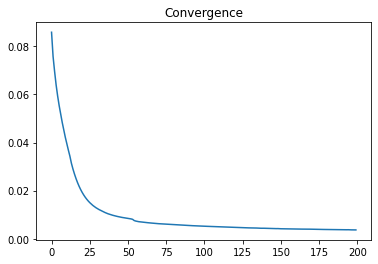

In [10]:
plt.figure()
plt.plot(errt)
plt.title('Convergence')

### Uploading test_x_01

In [11]:
test_x_01,sr2=librosa.load("test_x_01.wav",sr=None)
ipd.display(ipd.Audio(test_x_01,rate=16000))

### Performing STFT and taking absolute value of testx01

In [12]:
testx01=librosa.stft(test_x_01,n_fft=1024,hop_length=512)
testx01_abs=np.abs(testx01)
print(np.shape(testx01_abs))

(513, 142)


### Predicting outputs for test_x_01

In [13]:
test_x_01_tensor=torch.tensor(testx01_abs)
test_x_01_transpose=torch.transpose(test_x_01_tensor, 0, 1).to(device)
test_x_01_transpose.resize_(142,1, 513)
with torch.no_grad(): 
  new_outputs_test_x_01=model1(test_x_01_transpose)
print(np.shape(new_outputs_test_x_01))

torch.Size([142, 513])


### Recovered Signal for test_x_01

In [14]:
new_outputs1=torch.transpose(new_outputs_test_x_01,0,1)
new_output2=torch.div(torch.mul(torch.tensor(testx01,device=device),new_outputs1),torch.abs(torch.tensor(testx01,device=device)))
recovered_test_01_x=(new_output2.data).cpu().numpy()
signal_test_01_x=librosa.core.istft(recovered_test_01_x, hop_length=512)
ipd.display(ipd.Audio(librosa.core.istft(recovered_test_01_x, hop_length=512),rate=16000))

### Uploading test_x_02 signal

In [15]:
test_x_02,sr2=librosa.load("test_x_02.wav",sr=None)
ipd.display(ipd.Audio(test_x_02,rate=16000))

### Performing STFT and taking absolute value of testx02

In [16]:
testx02=librosa.stft(test_x_02,n_fft=1024,hop_length=512)
testx02_abs=np.abs(testx02)
print(np.shape(testx02_abs))

(513, 380)


### Predicting outputs for test_x_02

In [17]:
test_x_02_tensor=torch.tensor(testx02_abs)
test_x_02_transpose=torch.transpose(test_x_02_tensor, 0, 1).to(device)
test_x_02_transpose.resize_(380,1, 513)
with torch.no_grad():
  new_outputs_test_x_02=model1(test_x_02_transpose)
print(np.shape(new_outputs_test_x_02))

torch.Size([380, 513])


### Recovered Signal for test_x_02

In [18]:
new_output11=torch.transpose(new_outputs_test_x_02,0,1)
new_output12=torch.div(torch.mul(torch.tensor(testx02,device=device),new_output11),torch.abs(torch.tensor(testx02,device=device)))
recovered_test_02_x=(new_output12.data).cpu().numpy()
signal_test_02_x= librosa.core.istft(recovered_test_02_x, hop_length=512)
ipd.display(ipd.Audio(librosa.core.istft(recovered_test_02_x, hop_length=512),rate=16000))

## Code For SNR Calculation

In [19]:
def snr(ground_clean, recovered_one):
  import math
  a=min(len(ground_clean),len(recovered_one))

  ground1=ground_clean[0:a]
  recovered1=recovered_one[0:a]
  num=np.sum(np.square(ground1))
  diff=np.sum(np.square(ground1-recovered1))
  SNR=10*math.log(num/diff,10)
  return SNR

In [20]:
mod_S_tensor=torch.tensor(mod_X)
mod_S_t=torch.transpose(mod_S_tensor, 0, 1).to(device)
mod_S_t.resize_(2459,1, 513)
with torch.no_grad(): 
  new_outputs=model1(mod_S_t)
new_outputs13=torch.transpose(new_outputs,0,1)

## Recovering Clean Output for Train Signal

In [21]:
new_output12=torch.div(torch.mul(torch.tensor(X,device=device),new_outputs13),torch.abs(torch.tensor(X,device=device)))
recovered_test_03_x=(new_output12.data).cpu().numpy()
signal_test_03_x= librosa.core.istft(recovered_test_03_x, hop_length=512)
ipd.display(ipd.Audio(librosa.core.istft(recovered_test_03_x, hop_length=512),rate=16000))


In [22]:
snr(train_clean_male,signal_test_03_x)

14.378729480370753